<a href="https://colab.research.google.com/github/nafanur/face-detection-project/blob/main/UTS_ADTT_NAFA_NURHANIFAH.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# UTS ADTT NAFA NURHANIFAH 10060122030

## 1. Baca file gambar


In [ ]:
import cv2
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
#Disini pathnya diganti sesuai lokasi folder di gdrive kita, caranya pilih folder lalu klik titik tiga dan pilih "copy path"
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/dosenSTK.jpg')

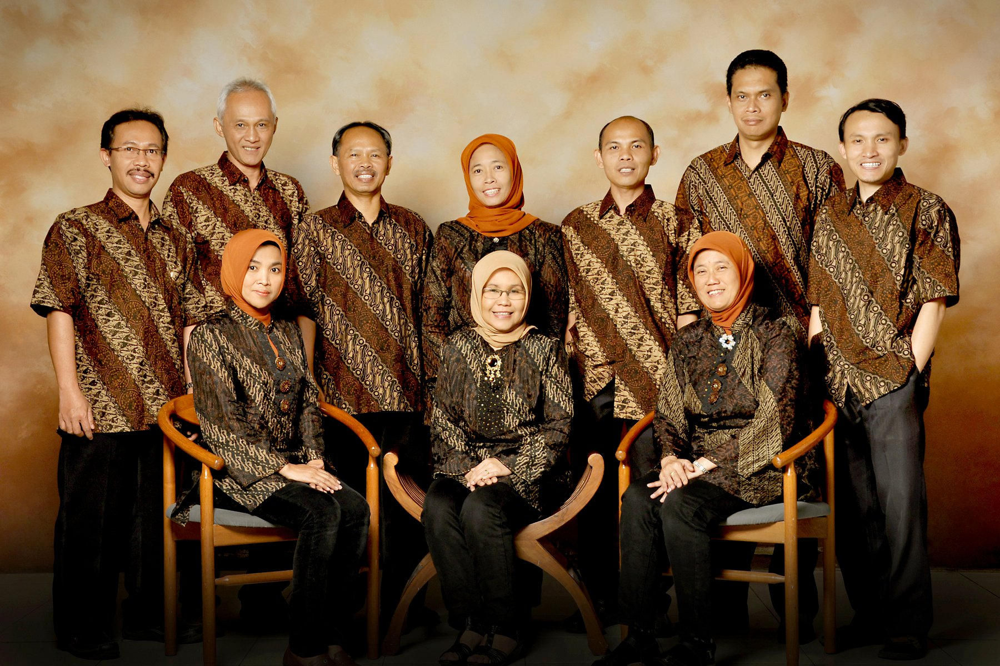

In [ ]:
#cv2.imshow(image) : perintah untuk di python
#cv2_imshow(image) : perintah untuk di google collab
from google.colab.patches import cv2_imshow
cv2_imshow(image)

In [ ]:
image.shape

(1200, 1800, 3)

## 2. a. Atur ulang ukuran resolusi gambar menjadi 800×600 piksel

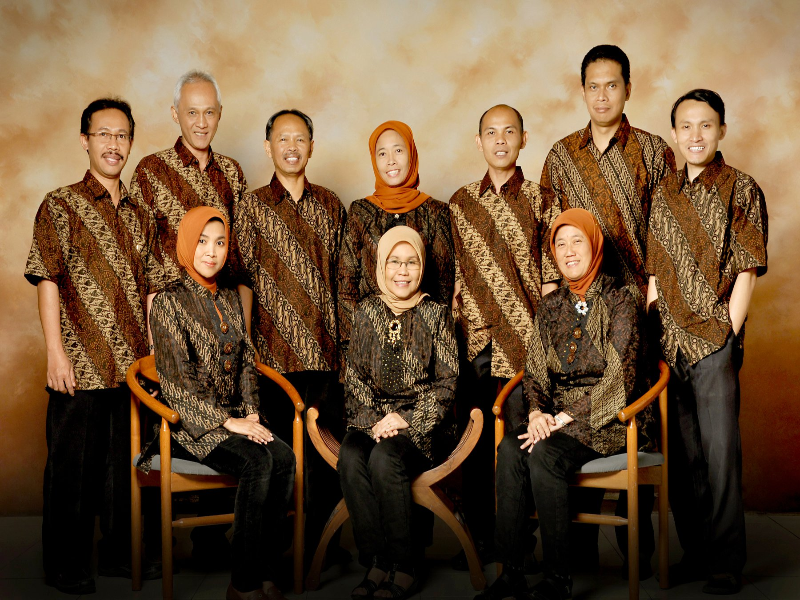

In [ ]:
#Resize image: agar resolusi gambar lebih rendah
image = cv2.resize(image, (800, 600))
cv2_imshow(image)

## 2. b. Konversi file gambar menjadi abu-abu (grayscale)

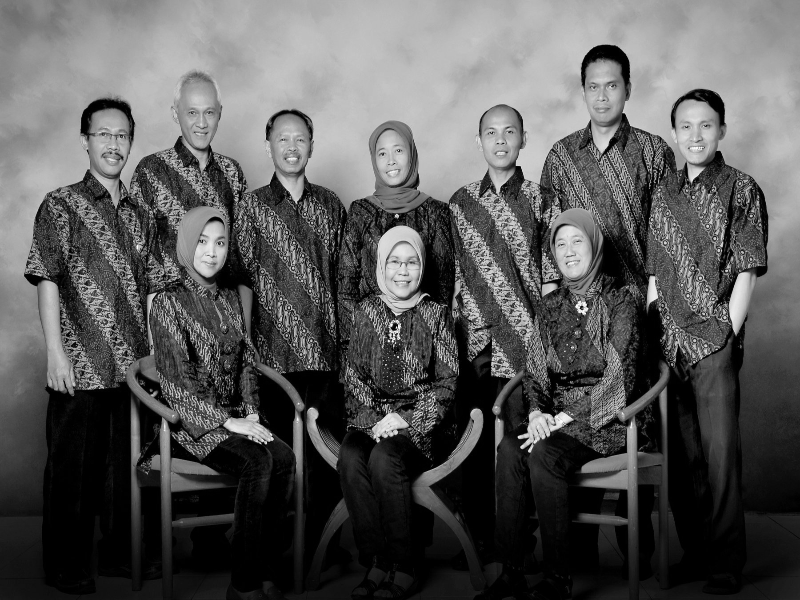

In [ ]:
#menampilkan gambar greyscale
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
cv2_imshow(image_gray)

In [ ]:
#MENAMPILKAN RESOLUSI GAMBAR BERWARNA
image.shape
#Yang pertama resolusi gambar berwarna: 600 * 800 * 3

(600, 800, 3)

In [ ]:
#MENAMPILKAN RESOLUSI GAMBAR GRAYSCALE
image_gray.shape
#yang kedua resolusi gambar abu: 600 * 800

(600, 800)

## 3. a. Lakukan deteksi wajah dengan Algoritme **Haarcascade**. Berapa wajah yang terdeteksi?

Wajah terdeteksi: 10


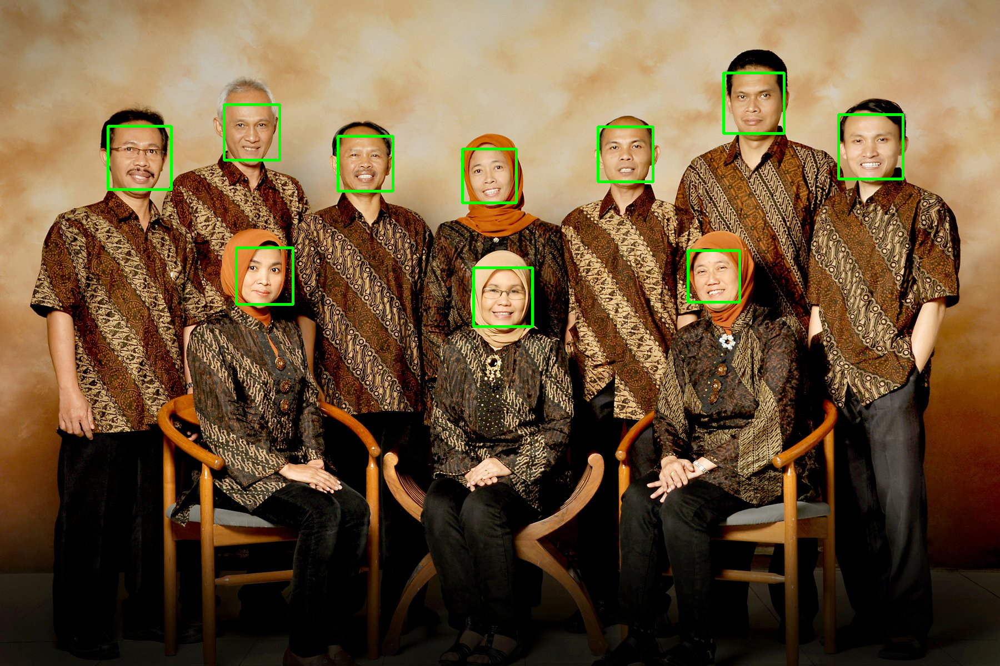

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/dosenSTK.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
haarcascade_detector = cv2.CascadeClassifier('/content/drive/MyDrive/Colab Notebooks/Computer Vision Masterclass/Cascades/haarcascade_frontalface_default.xml')
detections = haarcascade_detector.detectMultiScale( image_gray,
                                                   scaleFactor=1.20, # Lebih besar = proses lebih cepat, tapi bisa lewati wajah kecil. bantu kurangi deteksi ganda
                                                    minNeighbors=7,  # Semakin tinggi = lebih ketat (kurangi false positive), tapi terlalu tinggi = bisa lewati wajah beneran.
                                                    minSize=(70, 70), # Ukuran minimum wajah yang dicari dalam pixel. (70,70) cocok buat wajah sedang-dekat kamera.
                                                    )
for (x, y, w, h) in detections:
  cv2.rectangle(image, (x, y), (x + w, y + h), (0,255,0), 3) # Gambar kotak hijau tebal 3px di sekitar wajah yg terdeteksi.

print(f"Wajah terdeteksi: {len(detections)}")
cv2_imshow(image)

# NB: Haarcascade bisa mendeteksi 10 wajah
# kelemahan Haarcascade: harus mengubah2 parameter (scaleFactor,minNeighbors, minSize) nya agar deteksi wajah nya lebih akurat

## 3. b. Lakukan deteksi wajah dengan Algoritme **Histogram of Oriented Gradients (HOG)**. Berapa wajah yang terdeteksi?

Wajah terdeteksi: 10


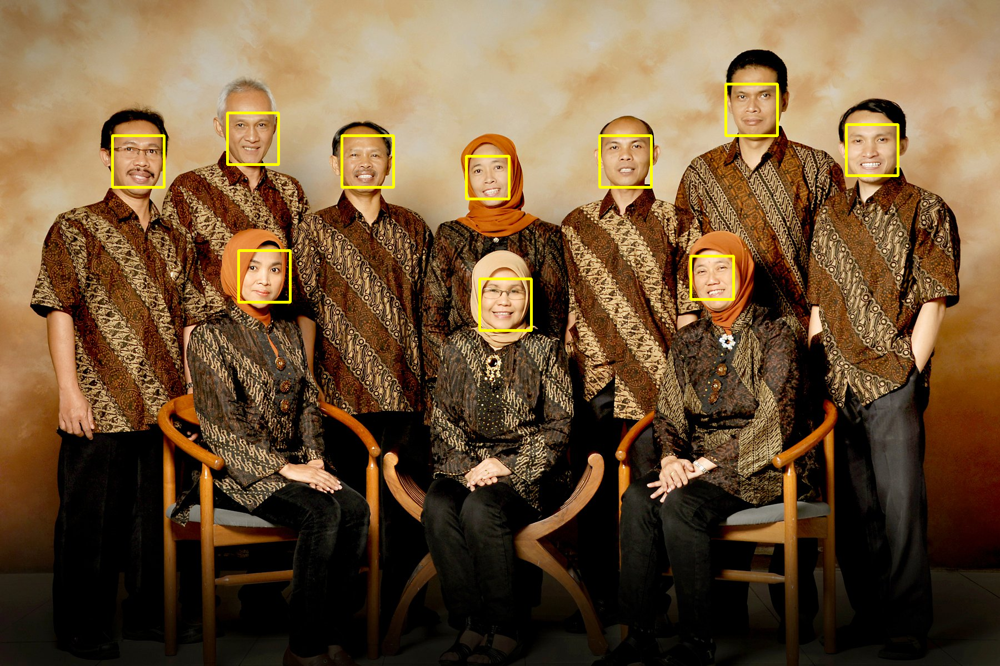

In [ ]:
image = cv2.imread('/content/drive/MyDrive/Colab Notebooks/dosenSTK.jpg')
image_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

face_detector_hog = dlib.get_frontal_face_detector() #disini tidak perlu menload xml karena HPG ini sudah ada dalam library
detections = face_detector_hog(image, 2) # Parameter ke-2 (upsample = 2) membantu mendeteksi wajah kecil

for face in detections:
    l, t, r, b = (face.left(), face.top(), face.right(), face.bottom())
    cv2.rectangle(image, (l, t), (r, b), (0, 255, 255), 3)

print(f"Wajah terdeteksi: {len(detections)}")
cv2_imshow(image)

# NB: dengan HOG bisa terdeteksi 10 wajah
# kelemahan HOG: harus mengubah2 parameter (unsample) nya agar deteksi wajah nya lebih akurat

## 4. Dari hasil nomor 3, algoritme apa yang lebih akurat? Apakah Haarcascade atau HOG?
**KESIMPULAN ALGORITMA:**
- Haarcascade: mendeteksi 10 wajah namun perlu menyesuaikan parameter scaleFactor, minNeighbors, minSize, klo tidak bisa false positive (bukan mendeteksi wajah / sasaran).
- HOG: mendeteksi 10 wajah, namun perlu menyesuaikan parameter unsample. Lebih stabil, lebih jarang false positive, cocok untuk wajah frontal.

HOG cenderung lebih akurat dalam:
1. Deteksi wajah frontal (menghadap kamera).
2. Stabilitas hasil (tidak mudah keliru mengenali objek bukan wajah).
3. Lebih jarang false positive, karena modelnya berbasis fitur orientasi dan machine learning.

Sedangkan: Haarcascade
1. Kecepatan deteksi tinggi
2. rentan terhadap deteksi ganda atau salah deteksi (misal mendeteksi bagian baju sebagai wajah).
3. Akurasinya sangat bergantung pada parameter tuning.

Algoritma yang disarankan yang bertujuan deteksi wajah dari berbagai arah (non-frontal) adalah CNN dlib.

Jadi, menurut saya, algoritme yang lebih akurat adalah HOG. Alasannya, pengaturannya jauh lebih sederhana karena hanya membutuhkan satu parameter saja yaitu unsample, sehingga proses penyesuaian menjadi lebih praktis. Berbeda dengan Haarcascade yang memerlukan penyesuaian tiga parameter sekaligus, yaitu scaleFactor, minNeighbors, dan minSize, sehingga lebih rumit. Selain itu, HOG sangat cocok digunakan pada gambar ini karena semua wajah menghadap ke depan (frontal), sesuai dengan karakteristik deteksi HOG.
